loading ascad dataset


In [3]:

import h5py
import numpy as np
from tqdm import tqdm
import discrete_random_variable as drv
from npeet.entropy_estimators import mi, micd, midd, midc

import torch
import torch.nn as nn
import torch.nn.functional as F

HW = [bin(n).count("1") for n in range(0,256)]

AES_sbox=[
    0x63,0x7c,0x77,0x7b,0xf2,0x6b,0x6f,0xc5,0x30,0x01,0x67,0x2b,0xfe,0xd7,0xab,0x76,
    0xca,0x82,0xc9,0x7d,0xfa,0x59,0x47,0xf0,0xad,0xd4,0xa2,0xaf,0x9c,0xa4,0x72,0xc0,
    0xb7,0xfd,0x93,0x26,0x36,0x3f,0xf7,0xcc,0x34,0xa5,0xe5,0xf1,0x71,0xd8,0x31,0x15,
    0x04,0xc7,0x23,0xc3,0x18,0x96,0x05,0x9a,0x07,0x12,0x80,0xe2,0xeb,0x27,0xb2,0x75,
    0x09,0x83,0x2c,0x1a,0x1b,0x6e,0x5a,0xa0,0x52,0x3b,0xd6,0xb3,0x29,0xe3,0x2f,0x84,
    0x53,0xd1,0x00,0xed,0x20,0xfc,0xb1,0x5b,0x6a,0xcb,0xbe,0x39,0x4a,0x4c,0x58,0xcf,
    0xd0,0xef,0xaa,0xfb,0x43,0x4d,0x33,0x85,0x45,0xf9,0x02,0x7f,0x50,0x3c,0x9f,0xa8,
    0x51,0xa3,0x40,0x8f,0x92,0x9d,0x38,0xf5,0xbc,0xb6,0xda,0x21,0x10,0xff,0xf3,0xd2,
    0xcd,0x0c,0x13,0xec,0x5f,0x97,0x44,0x17,0xc4,0xa7,0x7e,0x3d,0x64,0x5d,0x19,0x73,
    0x60,0x81,0x4f,0xdc,0x22,0x2a,0x90,0x88,0x46,0xee,0xb8,0x14,0xde,0x5e,0x0b,0xdb,
    0xe0,0x32,0x3a,0x0a,0x49,0x06,0x24,0x5c,0xc2,0xd3,0xac,0x62,0x91,0x95,0xe4,0x79,
    0xe7,0xc8,0x37,0x6d,0x8d,0xd5,0x4e,0xa9,0x6c,0x56,0xf4,0xea,0x65,0x7a,0xae,0x08,
    0xba,0x78,0x25,0x2e,0x1c,0xa6,0xb4,0xc6,0xe8,0xdd,0x74,0x1f,0x4b,0xbd,0x8b,0x8a,
    0x70,0x3e,0xb5,0x66,0x48,0x03,0xf6,0x0e,0x61,0x35,0x57,0xb9,0x86,0xc1,0x1d,0x9e,
    0xe1,0xf8,0x98,0x11,0x69,0xd9,0x8e,0x94,0x9b,0x1e,0x87,0xe9,0xce,0x55,0x28,0xdf,
    0x8c,0xa1,0x89,0x0d,0xbf,0xe6,0x42,0x68,0x41,0x99,0x2d,0x0f,0xb0,0x54,0xbb,0x16
]


def load_ascad_0():
    ascad_database_file = 'ASCAD.h5'
    
    
    f  = h5py.File(ascad_database_file, "r")
    
    X_profiling = f['Profiling_traces/traces'][()]
    Y_profiling = f['Profiling_traces/labels'][()]
    meta_profiling = f['Profiling_traces/metadata'][()]

    
        
    X_attack = f['Attack_traces/traces'][()]
    Y_attack = f['Attack_traces/labels'][()]
    meta_attack = f['Attack_traces/metadata'][()]
    
    real_key = meta_attack['key'][0,:]
    pt_attack = meta_attack['plaintext']
    
    f.close()
    
    print("Creating all target labels for the attack traces:")
    targets = np.zeros((X_attack.shape[0], 256), dtype='uint8')
    for i in range(X_attack.shape[0]):
        for k in range(256):
            targets[i, k] = AES_sbox[k^pt_attack[i,2]]
    
    return X_profiling, Y_profiling, X_attack,Y_attack, targets, real_key[2], meta_profiling,meta_attack

In [2]:
X_profiling, Y_profiling, X_attack, Y_attack, targets, key_attack, meta_profiling,meta_attack = load_ascad_0()

Creating all target labels for the attack traces:


# Histogram

In [13]:
itlib_no_traces = np.zeros((8 , 100))

c_j=0
for j in np.arange(500, 2001, 200):
    
    
    c_i=0
    for i in np.arange(0,700,7):
    
        

        itlib_no_traces[c_j,c_i] = drv.information_mutual(X_profiling[:j,i], Y_profiling[:j])
        c_i+=1
    c_j+=1

# KSG

In [19]:
def KSG_MI(x,y):

    o = np.array(x, dtype=int)
    h = np.array(y, dtype=int)

    # return mi(o.reshape(-1, 1) , h.reshape(-1, 1))
    return micd(o.reshape(-1, 1) , h.reshape(-1, 1))

In [20]:
ksg_no_traces = np.zeros((8 , 100))

c_j=0
for j in np.arange(500, 2001, 200):

    
    
    c_i=0
    for i in np.arange(0,700,7):
    
        

        ksg_no_traces[c_j,c_i] = KSG_MI(X_profiling[:j,i], Y_profiling[:j])
        c_i+=1
    c_j+=1
        

/home/mohammadn/.local/lib/python3.10/site-packages/npeet/entropy_estimators.py:230: UserWarning: Warning, after conditioning, on y=[0] insufficient data. Assuming maximal entropy in this case.
  warnings.warn(
/home/mohammadn/.local/lib/python3.10/site-packages/npeet/entropy_estimators.py:230: UserWarning: Warning, after conditioning, on y=[1] insufficient data. Assuming maximal entropy in this case.
  warnings.warn(
/home/mohammadn/.local/lib/python3.10/site-packages/npeet/entropy_estimators.py:230: UserWarning: Warning, after conditioning, on y=[2] insufficient data. Assuming maximal entropy in this case.
  warnings.warn(
/home/mohammadn/.local/lib/python3.10/site-packages/npeet/entropy_estimators.py:230: UserWarning: Warning, after conditioning, on y=[3] insufficient data. Assuming maximal entropy in this case.
  warnings.warn(
/home/mohammadn/.local/lib/python3.10/site-packages/npeet/entropy_estimators.py:230: UserWarning: Warning, after conditioning, on y=[4] insufficient data. A

# MRE

In [4]:
from MRE import *
def MBRE_MI(x,y):
    o = np.array(x, dtype=int)
    h = np.array(y, dtype=int)
    x = torch.tensor(o, dtype=torch.float32)
    y = torch.tensor(h, dtype=torch.float32)

    sigma_x = get_sigma(1,700,torch.std(x) )
    sigma_y = get_sigma(1,700,torch.std(y) )

    

    return calculate_MI(x , y,1.01, sigma_x,sigma_y,False)

In [5]:
MRE_no_traces = np.zeros((8 , 100))

c_j=0
for j in np.arange(500, 2001, 200):

    
    
    c_i=0
    for i in np.arange(0,700,7):
    
        

        MRE_no_traces[c_j,c_i] = MBRE_MI(X_profiling[:j,i], Y_profiling[:j])
        c_i+=1
    c_j+=1
        

# Plots

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import PolyCollection

def plot_3d(pl , zlim =3):
    x = np.arange(0, 700, 7)
    lambdas = np.arange(500, 2001, 200)

    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(projection='3d')

    facecolors = plt.colormaps['viridis_r'](
        np.linspace(0, 1, len(lambdas))
    )

    verts = []

    for i, l in enumerate(lambdas):
        y = pl[i]

        # polygon: curve + baseline
        verts.append(
            list(zip(x, y)) + [(x[-1], 0), (x[0], 0)]
        )

    poly = PolyCollection(
        verts,
        facecolors=facecolors,
        alpha=0.7
    )

    ax.add_collection3d(poly, zs=lambdas, zdir='y')

    ax.set(
        xlim=(0, 700),
        ylim=(400, 2100),
        zlim=(0, zlim),
        xlabel='t',
        ylabel='#traces',
        zlabel='MI'
    )

    plt.show()

## 3D Histogram

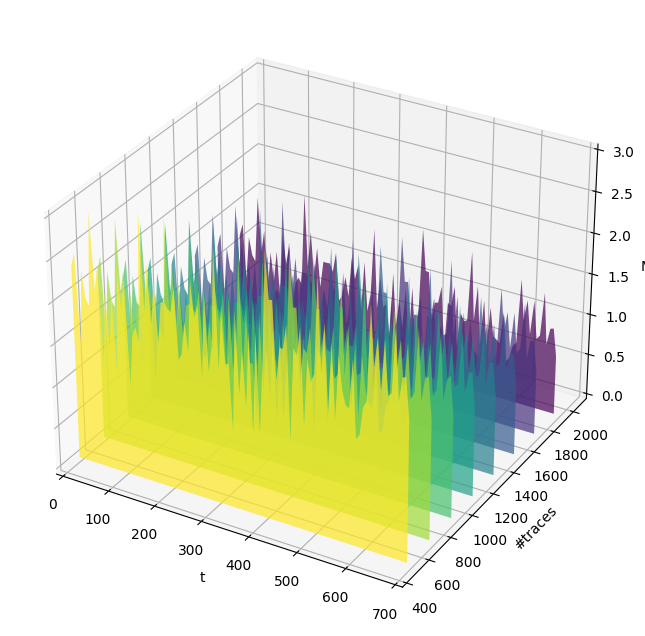

In [30]:
plot_3d(itlib_no_traces , 3)

## 3D KSG

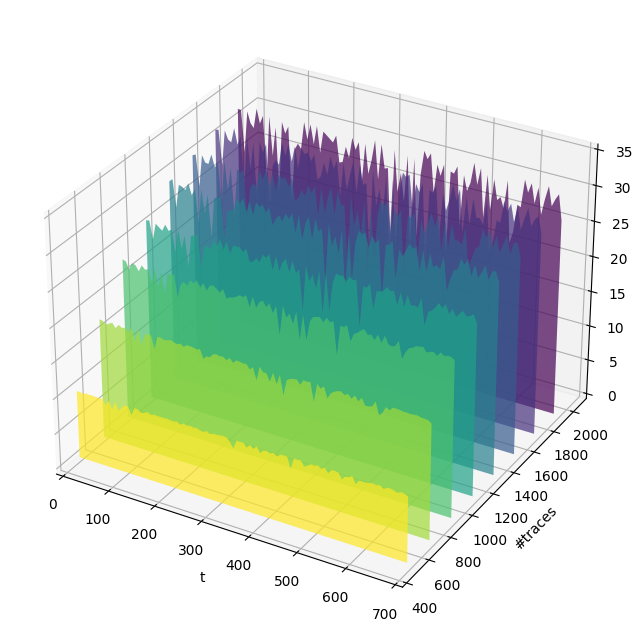

In [31]:
plot_3d(ksg_no_traces , 35)

## 3D MRE

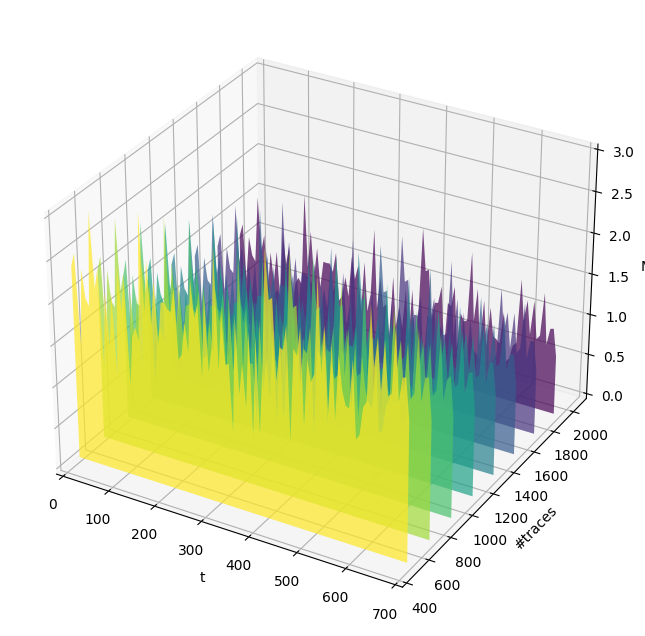

In [8]:
plot_3d(MRE_no_traces , 3)